# SETUP

In [5]:
import numpy as np
import random
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy.interpolate import PchipInterpolator
from scipy.spatial.distance import cdist

def compute_IGD(true_front, est_front):
    distances = cdist(true_front, est_front)  # shape: [len(true), len(estimated)]
    min_distances = np.min(distances, axis=1)  # for each true point, closest estimated
    return np.mean(min_distances)

def get_fPareto_function(pf_df):
    """Return interpolator function fPareto(c) = max score at cost c.
    
    Handles:
    - Constant scores
    - Single value
    - Extrapolation bounded by min/max
    - Log-cost safety
    """

    cost = pf_df['Cost'].values
    score = pf_df['Score'].values

    if len(cost) == 1:
        const_score = float(score[0])
        return lambda c: const_score

    sorted_idx = np.argsort(cost)
    cost = cost[sorted_idx]
    score = score[sorted_idx]

    if np.any(cost <= 0):
        raise ValueError("Cost must be positive")

    logc = np.log(cost)

    if np.all(score == score[0]):
        const_score = float(score[0])
        return lambda c: const_score

    pchip = PchipInterpolator(logc, score, extrapolate=True)

    min_score, max_score = np.min(score), np.max(score)
    return lambda c: float(np.clip(pchip(np.log(c)), min_score, max_score))

def sample_ts_theta(alpha, beta):
    X = np.random.gamma(alpha, 1.0)
    Y = np.random.gamma(beta,  1.0)
    return X / (X + Y)

def compute_pareto(df, cost_col, score_col):
    data = df.sort_values(by=[cost_col, score_col], ascending=[True, False])
    pareto = []
    max_score = -np.inf
    for _, row in data.iterrows():
        if row[score_col] > max_score:
            pareto.append(row)
            max_score = row[score_col]
    return pd.DataFrame(pareto)

def plot_frontier_panel(ax, est_data, true_data, jitter=False, seed=None, lam=None):
    est_df = est_data.copy()
    true_df = true_data.copy()

    if jitter:
        np.random.seed(seed)
        est_df['Score'] += np.random.normal(0, 0.05, size=len(est_df))

    est_pf = compute_pareto(est_df, 'Cost', 'Score')
    true_pf = compute_pareto(true_df, 'Cost', 'Score')

    true_pf_models = set(true_pf['Model'])
    est_df['Color'] = est_df['Model'].apply(lambda m: 'blue' if m in true_pf_models else 'gray')

    sns.scatterplot(
        data=est_df, x='Cost', y='Score', hue='Color',
        palette={'gray': 'gray', 'blue': 'blue'},
        s=60, alpha=0.5, ax=ax, legend=False, zorder=1
    )

    if len(est_pf) == 1:
        x = est_pf['Cost'].values[0]
        y = est_pf['Score'].values[0]
        ax.scatter(x, y, color='green', s=100, edgecolor='black',
                   linewidth=1.2, zorder=3, label='Estimated PF (single point)')
    else:
        logc = np.log(est_pf['Cost'].values)
        sc = est_pf['Score'].values
        pchip = PchipInterpolator(logc, sc)
        logc_new = np.linspace(logc.min(), logc.max(), 300)
        cost_new = np.exp(logc_new)
        score_new = pchip(logc_new)

        ax.fill_between(cost_new, lam * score_new, score_new,
                        color='green', alpha=0.15, label=f'Estimated PF Zone')
        ax.plot(cost_new, score_new, color='green', linewidth=2,
                label="Estimated PF", zorder=2)

        sns.scatterplot(x=est_pf['Cost'], y=est_pf['Score'],
                        color='green', s=100, edgecolor='black',
                        linewidth=1.2, ax=ax, legend=False, zorder=3)

    if len(true_pf) == 1:
        x = true_pf['Cost'].values[0]
        y = true_pf['Score'].values[0]
        ax.scatter(x, y, color='blue', s=80, edgecolor='black',
                   linewidth=1.2, zorder=4, label='True PF (single point)')
    else:
        logc_true = np.log(true_pf['Cost'].values)
        sc_true = true_pf['Score'].values
        pchip_true = PchipInterpolator(logc_true, sc_true)
        logc_new_true = np.linspace(logc_true.min(), logc_true.max(), 300)
        cost_new_true = np.exp(logc_new_true)
        score_new_true = pchip_true(logc_new_true)

        ax.plot(cost_new_true, score_new_true, 'b--', linewidth=2,
                label="True PF", zorder=4)

        sns.scatterplot(x=true_pf['Cost'], y=true_pf['Score'],
                        color='blue', s=80, edgecolor='black',
                        linewidth=1.2, ax=ax, legend=False, zorder=4)

    for model in true_pf_models:
        est_row = est_df[est_df['Model'] == model]
        true_row = true_df[true_df['Model'] == model]
        if not est_row.empty and not true_row.empty:
            ax.plot(
                [est_row['Cost'].values[0], true_row['Cost'].values[0]],
                [est_row['Score'].values[0], true_row['Score'].values[0]],
                color='blue', linewidth=1.0, linestyle='--', alpha=0.8
            )

    ax.set_xscale('log')
    ax.set_xlabel("Cost")
    ax.set_ylabel("Score")
    ax.set_ylim(0, 1)
    ax.set_xlim(est_df['Cost'].min() * 0.9, est_df['Cost'].max() * 1.1)
    ax.grid(True, which='both', linestyle='--', linewidth=0.4, alpha=0.3)
    ax.legend()

In [6]:
np.random.seed(0)
random.seed(42)

# initial_seeds = [
#     0, 30, 50, 70, 90, 110, 130, 150,190,220,
#     4, 34, 54, 74, 94, 114, 134, 154,194,224,
#     9, 39, 59, 79, 99, 119, 139, 159,199, 229] 

initial_seeds = [x for x in range(30)] *30

N_ARMS  = 50
GLOBAL_GOOD_PROB = 0.55
LOCAL_GOOD_PROB = 0.6

clusters = list(range(1,11)) 
seed_to_cluster = {}
for idx, seed in enumerate(initial_seeds):
    seed_to_cluster[seed] = idx % 10

print(seed_to_cluster)

cluster_util = {}
for c in clusters:
    size = random.randint(1, 5)               # random length
    util = random.sample(clusters, size)      # choose different cluster IDs
    util.sort()                                # sort in ascending order
    cluster_util[c-1] = util

print(cluster_util)

SEEDS = np.random.permutation(initial_seeds)
global_good_indices = np.random.choice(N_ARMS, size=10, replace=False)
arm_costs = np.random.uniform(0.4, 2.0, size=N_ARMS)
arm_costs[global_good_indices] = np.random.uniform(2.5, 3.0, size=len(global_good_indices))
norm_costs = (arm_costs - arm_costs.min()) / (arm_costs.max() - arm_costs.min())
N_COLS = 3
N_ROWS = 100

{0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 0, 11: 1, 12: 2, 13: 3, 14: 4, 15: 5, 16: 6, 17: 7, 18: 8, 19: 9, 20: 0, 21: 1, 22: 2, 23: 3, 24: 4, 25: 5, 26: 6, 27: 7, 28: 8, 29: 9}
{0: [1], 1: [3, 4, 10], 2: [9], 3: [10], 4: [1, 2, 8, 10], 5: [1, 9], 6: [2, 4, 7, 9, 10], 7: [1, 3, 4, 5, 6], 8: [3, 4, 5], 9: [2, 7, 10]}


# Constrained

## 0.001

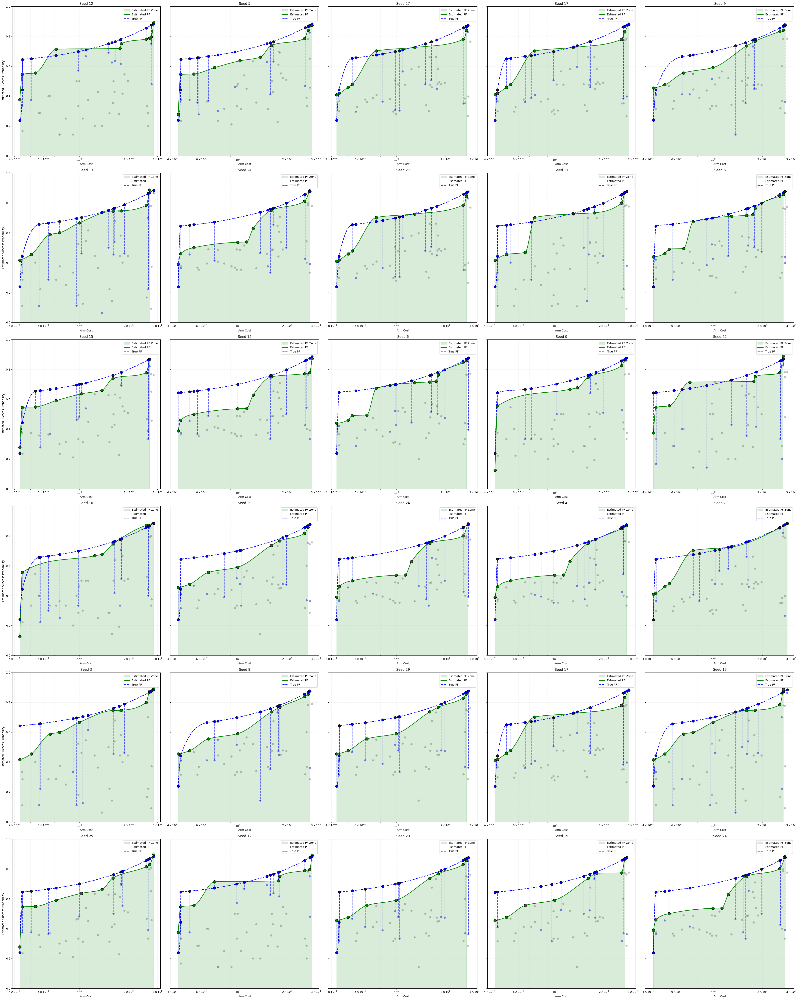

In [8]:
import itertools
N_ROUNDS = 1696
N_PRIOR = 0
K = 0.001
# LR = 0.2
L = 0

# --------- Plot Setup ---------
N_PLOT = 30  # Last 30 iterations to plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 50), sharey=True)
axes = axes.flatten()

galpha = np.ones((N_ARMS, 11, 11))
gbeta = np.ones((N_ARMS, 11, 11))
calls = 0
igd = []
cost_regrets = []
all_avg_regret = []
called_arms = [set() for _ in range(len(SEEDS))]
model_labels = [f'arm_{i}' for i in range(N_ARMS)]
f1s = []

for idx, seed in enumerate(SEEDS):
    np.random.seed(seed)

    # --- Initialize true probabilities ---
    true_probs = np.linspace(0.1, 0.5, N_ARMS)
    half_from_global = np.random.choice(global_good_indices, size=4, replace=False)
    true_probs[half_from_global] = GLOBAL_GOOD_PROB + arm_costs[half_from_global] * 0.1

    other_indices = np.setdiff1d(np.arange(N_ARMS), global_good_indices)
    local_other = np.random.choice(other_indices, size=10, replace=False)
    local_good_indices = np.concatenate((half_from_global, local_other))
    true_probs[local_good_indices] = LOCAL_GOOD_PROB + arm_costs[local_good_indices] * 0.1

    # --- Compute cluster Cartesian pairs ---
    util = cluster_util[seed_to_cluster[seed]] if cluster_util[seed_to_cluster[seed]] != [] else [0]
    unique_pairs = list(itertools.product(util, repeat=2))

    tri_alpha = np.tril(galpha, k=0)
    tri_beta  = np.tril(gbeta,  k=0)

    rows, cols = np.array(unique_pairs).T
    lalpha = tri_alpha[:, rows, cols].sum(axis=1)
    lbeta  = tri_beta[:, rows, cols].sum(axis=1)

    n = lalpha + lbeta
    myu = lalpha/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    alpha = myu * n_new
    beta  = (1 - myu) * n_new

    preva, prevb = alpha.copy(), beta.copy()
    optimal_prob = true_probs.max()

    # --- Storage for arms & successes ---
    arms = np.empty(N_ROUNDS, dtype=int)
    successes = np.empty(N_ROUNDS, dtype=int)

    # ----------- TS MAIN LOOP -----------
    for t in range(N_ROUNDS):
        theta = sample_ts_theta(alpha, beta)
        arm = np.argmax(theta)
        arms[t] = arm

        success = np.random.binomial(1, true_probs[arm])
        successes[t] = success

        alpha[arm] += success
        beta[arm]  += 1 - success

    calls += N_ROUNDS
    called_arms[idx].update(arms)

    # Compute regret & cost regret in bulk
    regrets = optimal_prob - true_probs[arms]
    cost_regrets.extend(arm_costs[arms] * regrets)
    all_avg_regret.append(np.mean(regrets))

    est_probs = alpha / (alpha + beta)
    est_data = pd.DataFrame({'Cost': arm_costs, 'Score': est_probs, 'Model': model_labels})
    true_data = pd.DataFrame({'Cost': arm_costs, 'Score': true_probs, 'Model': model_labels})

    fPareto = get_fPareto_function(compute_pareto(est_data, 'Cost', 'Score'))
    est_pf = compute_pareto(est_data, 'Cost', 'Score')
    true_pf = compute_pareto(true_data, 'Cost', 'Score')
    igd.append(compute_IGD(true_pf[['Cost', 'Score']].to_numpy(),
                           est_pf[['Cost', 'Score']].to_numpy()))

    est_models = set(est_pf["Model"])
    true_models = set(true_pf["Model"])
    tp = len(est_models & true_models)
    fp = len(est_models - true_models)
    fn = len(true_models - est_models)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    f1s.append(f1)

    # --- Update global priors for meta-learning ---
    oalp = alpha - preva
    obet = beta - prevb
    for x in range(N_ARMS):
        for y in unique_pairs:
            galpha[x][y] += oalp[x]
            gbeta[x][y] += obet[x]

    # ----------- Plot last 30 seeds using plot_frontier_panel -----------
    if idx >= len(SEEDS) - N_PLOT:
        ax_idx = idx - (len(SEEDS) - N_PLOT)
        ax = axes[ax_idx]
        plot_frontier_panel(ax, est_data, true_data, jitter=False, seed=seed, lam=L)
        ax.set_title(f"Seed {seed}")
        ax.set_xlabel("Arm Cost")
        ax.set_ylabel("Estimated Success Probability")

# Remove unused subplots
for j in range(N_PLOT, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Summary stats ---
avg_api_calls = calls // len(SEEDS)
avg_arms_called = np.mean([len(x) for x in called_arms])
avg_igd = np.mean(igd)
avg_regret = np.mean(all_avg_regret)
avg_costregret = np.mean(cost_regrets)


In [9]:
print(f"Number of API calls per seed: {avg_api_calls}")
print(f"Average distinct arms called per seed: {avg_arms_called:.2f}")
print(f"Pareto quality (mean IGD): {avg_igd:.4f}")
print(f"Average regret per pull: {avg_regret:.4f}")
print(f"Average cost regret per pull: {avg_costregret:.4f}")
print(f"Average F1 Score:  {np.mean(f1s):.4f}")

Number of API calls per seed: 1696
Average distinct arms called per seed: 5.20
Pareto quality (mean IGD): 0.1176
Average regret per pull: 0.0231
Average cost regret per pull: 0.0608
Average F1 Score:  0.3923


Util: [1], Alpha: 113.0, Beta: 54.0
Util: [3, 4, 10], Alpha: 6.0, Beta: 50.0
Util: [9], Alpha: 1.0, Beta: 4.0
Util: [10], Alpha: 1.0, Beta: 15.0
Util: [1, 2, 8, 10], Alpha: 122.0, Beta: 141.0
Util: [1, 9], Alpha: 115.0, Beta: 59.0
Util: [2, 4, 7, 9, 10], Alpha: 15.0, Beta: 60.0
Util: [1, 3, 4, 5, 6], Alpha: 127.0, Beta: 86.0
Util: [3, 4, 5], Alpha: 6.0, Beta: 24.0
Util: [2, 7, 10], Alpha: 6.0, Beta: 36.0


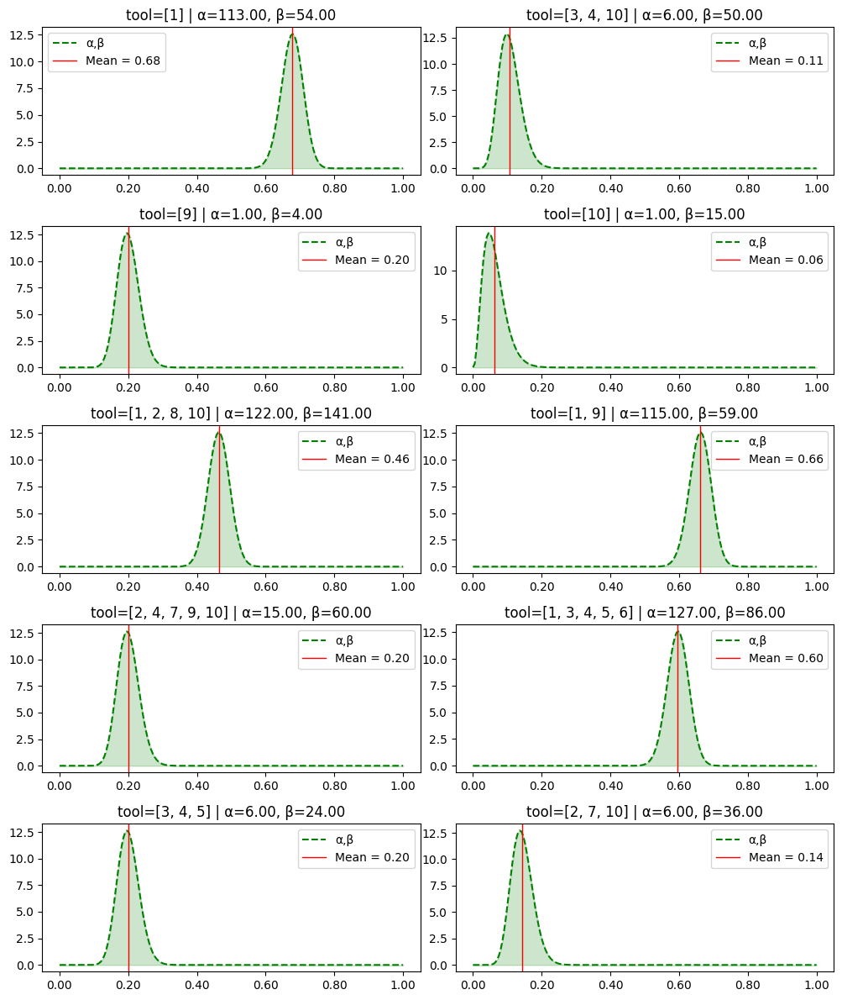

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy.stats import beta

fig, axes = plt.subplots(5, 2, figsize=(10, 12))  # 5 rows × 2 cols
axes = axes.flatten()  # so we can index them easily

for idx, x in enumerate(range(10)):
    util = cluster_util[x] if cluster_util[x] != [] else [0]
    cartesian = list(itertools.product(util, repeat=2))
    unique_pairs = cartesian

    lalpha = [
        np.sum([np.tril(galpha, k=0)[m][pair] for pair in unique_pairs])
        for m in range(galpha.shape[0])
    ]
    lbeta = [
        np.sum([np.tril(gbeta, k=0)[m][pair] for pair in unique_pairs])
        for m in range(gbeta.shape[0])
    ]

    a = lalpha[5]
    b = lbeta[5]
    # w = 0.3
    n=a+b
    myu = a/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    # alpha = tmp * np.array(myu, dtype=float)
    # beta  = tmp * (1-np.array(myu, dtype=float))
   
    # w = np.maximum(np.exp(-K * n),1e-2)
    print(f"Util: {util}, Alpha: {a}, Beta: {b}")

    x_vals = np.linspace(0, 1, 200)

    # Base Beta PDF (blue)
    y_base = beta.pdf(x_vals, a, b)
    mean_base = a / (a + b)

    # Scaled Beta PDF (green)
    y_scaled = beta.pdf(x_vals, n_new * myu, n_new * (1-myu))
    mean_scaled = (n_new * myu) / ((n_new * myu) + n_new * (1-myu))

    ax = axes[idx]
    # ax.plot(x_vals, y_base, color="blue", label="α, β")
    ax.plot(x_vals, y_scaled, color="green", linestyle="--", label=f"α,β")

    # Fill the area under scaled curve with green
    ax.fill_between(x_vals, y_scaled, color="green", alpha=0.2)

    # Add vertical lines for means, with legend labels
    ax.axvline(mean_base, color="red", linestyle="-", linewidth=1,
               label=f"Mean = {mean_base:.2f}")
    

    # Create ticks: regular 0.1 steps + mean positions
    base_ticks = np.round(np.arange(0, 1.01, 0.2), 2).tolist()
    special_ticks = sorted(set(base_ticks))
    ax.set_xticks(special_ticks)
    ax.set_xticklabels([f"{t:.2f}" for t in special_ticks])

    ax.set_title(f"tool={util} | α={a:.2f}, β={b:.2f}")
    ax.legend()

plt.tight_layout()
plt.show()


## 0.005

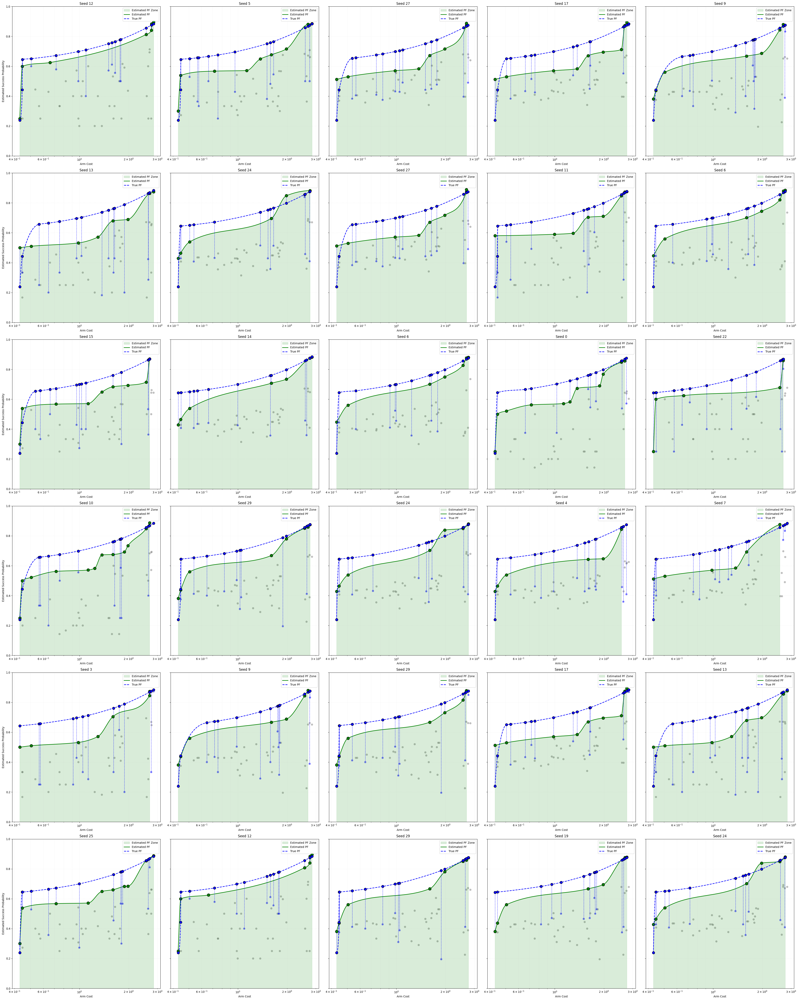

In [12]:
import itertools
N_ROUNDS = 1696
N_PRIOR = 0
K = 0.005
# LR = 0.2
L = 0

# --------- Plot Setup ---------
N_PLOT = 30  # Last 30 iterations to plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 50), sharey=True)
axes = axes.flatten()

galpha = np.ones((N_ARMS, 11, 11))
gbeta = np.ones((N_ARMS, 11, 11))
calls = 0
igd = []
cost_regrets = []
all_avg_regret = []
called_arms = [set() for _ in range(len(SEEDS))]
model_labels = [f'arm_{i}' for i in range(N_ARMS)]
f1s = []

for idx, seed in enumerate(SEEDS):
    np.random.seed(seed)

    # --- Initialize true probabilities ---
    true_probs = np.linspace(0.1, 0.5, N_ARMS)
    half_from_global = np.random.choice(global_good_indices, size=4, replace=False)
    true_probs[half_from_global] = GLOBAL_GOOD_PROB + arm_costs[half_from_global] * 0.1

    other_indices = np.setdiff1d(np.arange(N_ARMS), global_good_indices)
    local_other = np.random.choice(other_indices, size=10, replace=False)
    local_good_indices = np.concatenate((half_from_global, local_other))
    true_probs[local_good_indices] = LOCAL_GOOD_PROB + arm_costs[local_good_indices] * 0.1

    # --- Compute cluster Cartesian pairs ---
    util = cluster_util[seed_to_cluster[seed]] if cluster_util[seed_to_cluster[seed]] != [] else [0]
    unique_pairs = list(itertools.product(util, repeat=2))

    tri_alpha = np.tril(galpha, k=0)
    tri_beta  = np.tril(gbeta,  k=0)

    rows, cols = np.array(unique_pairs).T
    lalpha = tri_alpha[:, rows, cols].sum(axis=1)
    lbeta  = tri_beta[:, rows, cols].sum(axis=1)

    n = lalpha + lbeta
    myu = lalpha/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    alpha = myu * n_new
    beta  = (1 - myu) * n_new

    preva, prevb = alpha.copy(), beta.copy()
    optimal_prob = true_probs.max()

    # --- Storage for arms & successes ---
    arms = np.empty(N_ROUNDS, dtype=int)
    successes = np.empty(N_ROUNDS, dtype=int)

    # ----------- TS MAIN LOOP -----------
    for t in range(N_ROUNDS):
        theta = sample_ts_theta(alpha, beta)
        arm = np.argmax(theta)
        arms[t] = arm

        success = np.random.binomial(1, true_probs[arm])
        successes[t] = success

        alpha[arm] += success
        beta[arm]  += 1 - success

    calls += N_ROUNDS
    called_arms[idx].update(arms)

    # Compute regret & cost regret in bulk
    regrets = optimal_prob - true_probs[arms]
    cost_regrets.extend(arm_costs[arms] * regrets)
    all_avg_regret.append(np.mean(regrets))

    est_probs = alpha / (alpha + beta)
    est_data = pd.DataFrame({'Cost': arm_costs, 'Score': est_probs, 'Model': model_labels})
    true_data = pd.DataFrame({'Cost': arm_costs, 'Score': true_probs, 'Model': model_labels})

    fPareto = get_fPareto_function(compute_pareto(est_data, 'Cost', 'Score'))
    est_pf = compute_pareto(est_data, 'Cost', 'Score')
    true_pf = compute_pareto(true_data, 'Cost', 'Score')
    igd.append(compute_IGD(true_pf[['Cost', 'Score']].to_numpy(),
                           est_pf[['Cost', 'Score']].to_numpy()))

    est_models = set(est_pf["Model"])
    true_models = set(true_pf["Model"])
    tp = len(est_models & true_models)
    fp = len(est_models - true_models)
    fn = len(true_models - est_models)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    f1s.append(f1)

    # --- Update global priors for meta-learning ---
    oalp = alpha - preva
    obet = beta - prevb
    for x in range(N_ARMS):
        for y in unique_pairs:
            galpha[x][y] += oalp[x]
            gbeta[x][y] += obet[x]

    # ----------- Plot last 30 seeds using plot_frontier_panel -----------
    if idx >= len(SEEDS) - N_PLOT:
        ax_idx = idx - (len(SEEDS) - N_PLOT)
        ax = axes[ax_idx]
        plot_frontier_panel(ax, est_data, true_data, jitter=False, seed=seed, lam=L)
        ax.set_title(f"Seed {seed}")
        ax.set_xlabel("Arm Cost")
        ax.set_ylabel("Estimated Success Probability")

# Remove unused subplots
for j in range(N_PLOT, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Summary stats ---
avg_api_calls = calls // len(SEEDS)
avg_arms_called = np.mean([len(x) for x in called_arms])
avg_igd = np.mean(igd)
avg_regret = np.mean(all_avg_regret)
avg_costregret = np.mean(cost_regrets)


In [13]:
print(f"Number of API calls per seed: {avg_api_calls}")
print(f"Average distinct arms called per seed: {avg_arms_called:.2f}")
print(f"Pareto quality (mean IGD): {avg_igd:.4f}")
print(f"Average regret per pull: {avg_regret:.4f}")
print(f"Average cost regret per pull: {avg_costregret:.4f}")
print(f"Average F1 Score:  {np.mean(f1s):.4f}")

Number of API calls per seed: 1696
Average distinct arms called per seed: 7.80
Pareto quality (mean IGD): 0.1523
Average regret per pull: 0.0228
Average cost regret per pull: 0.0587
Average F1 Score:  0.3779


Util: [1], Alpha: 72.0, Beta: 35.0
Util: [3, 4, 10], Alpha: 7.0, Beta: 34.0


Util: [9], Alpha: 1.0, Beta: 4.0
Util: [10], Alpha: 2.0, Beta: 9.0
Util: [1, 2, 8, 10], Alpha: 90.0, Beta: 84.0
Util: [1, 9], Alpha: 74.0, Beta: 40.0
Util: [2, 4, 7, 9, 10], Alpha: 18.0, Beta: 42.0
Util: [1, 3, 4, 5, 6], Alpha: 86.0, Beta: 61.0
Util: [3, 4, 5], Alpha: 6.0, Beta: 18.0
Util: [2, 7, 10], Alpha: 9.0, Beta: 22.0


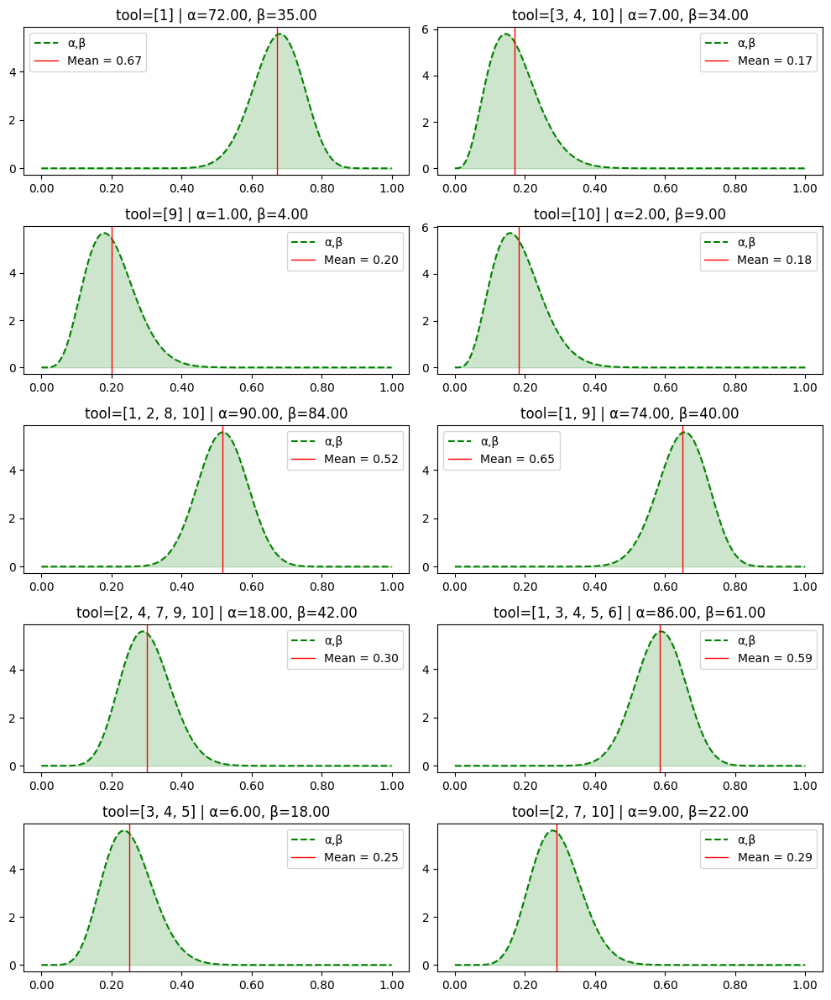

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy.stats import beta

fig, axes = plt.subplots(5, 2, figsize=(10, 12))  # 5 rows × 2 cols
axes = axes.flatten()  # so we can index them easily

for idx, x in enumerate(range(10)):
    util = cluster_util[x] if cluster_util[x] != [] else [0]
    cartesian = list(itertools.product(util, repeat=2))
    unique_pairs = cartesian

    lalpha = [
        np.sum([np.tril(galpha, k=0)[m][pair] for pair in unique_pairs])
        for m in range(galpha.shape[0])
    ]
    lbeta = [
        np.sum([np.tril(gbeta, k=0)[m][pair] for pair in unique_pairs])
        for m in range(gbeta.shape[0])
    ]

    a = lalpha[5]
    b = lbeta[5]
    # w = 0.3
    n=a+b
    myu = a/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    # alpha = tmp * np.array(myu, dtype=float)
    # beta  = tmp * (1-np.array(myu, dtype=float))
   
    # w = np.maximum(np.exp(-K * n),1e-2)
    print(f"Util: {util}, Alpha: {a}, Beta: {b}")

    x_vals = np.linspace(0, 1, 200)

    # Base Beta PDF (blue)
    y_base = beta.pdf(x_vals, a, b)
    mean_base = a / (a + b)

    # Scaled Beta PDF (green)
    y_scaled = beta.pdf(x_vals, n_new * myu, n_new * (1-myu))
    mean_scaled = (n_new * myu) / ((n_new * myu) + n_new * (1-myu))

    ax = axes[idx]
    # ax.plot(x_vals, y_base, color="blue", label="α, β")
    ax.plot(x_vals, y_scaled, color="green", linestyle="--", label=f"α,β")

    # Fill the area under scaled curve with green
    ax.fill_between(x_vals, y_scaled, color="green", alpha=0.2)

    # Add vertical lines for means, with legend labels
    ax.axvline(mean_base, color="red", linestyle="-", linewidth=1,
               label=f"Mean = {mean_base:.2f}")
    

    # Create ticks: regular 0.1 steps + mean positions
    base_ticks = np.round(np.arange(0, 1.01, 0.2), 2).tolist()
    special_ticks = sorted(set(base_ticks))
    ax.set_xticks(special_ticks)
    ax.set_xticklabels([f"{t:.2f}" for t in special_ticks])

    ax.set_title(f"tool={util} | α={a:.2f}, β={b:.2f}")
    ax.legend()

plt.tight_layout()
plt.show()


## 0.01

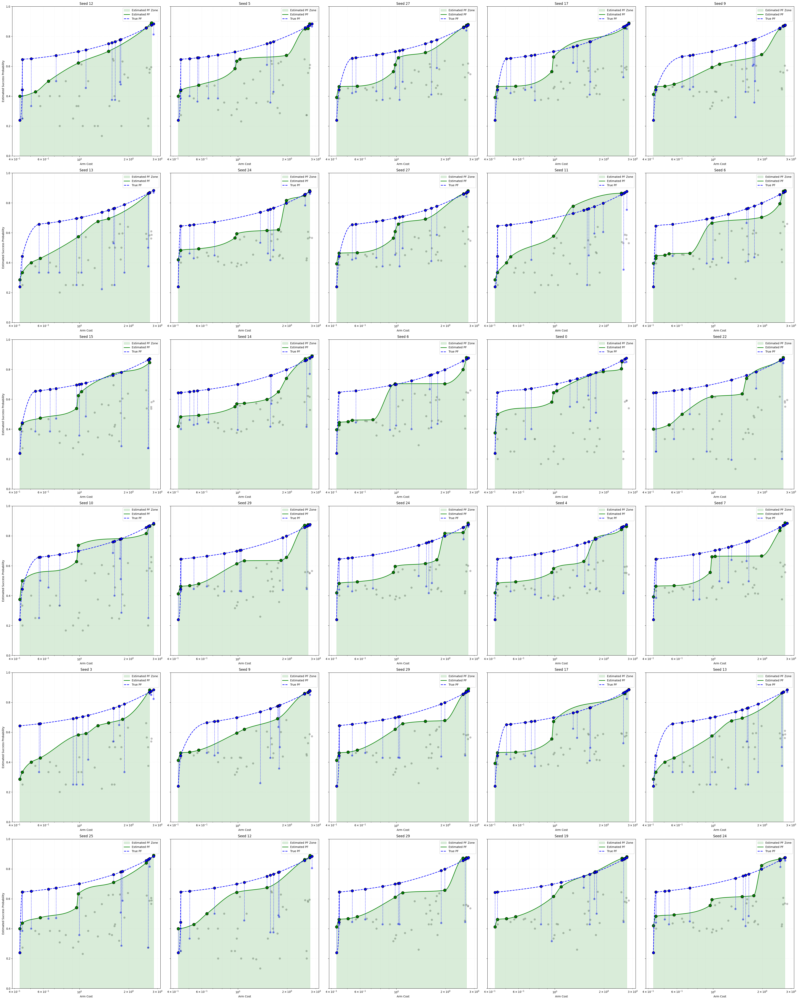

In [15]:
import itertools
N_ROUNDS = 1696
N_PRIOR = 0
K = 0.01
# LR = 0.2
L = 0

# --------- Plot Setup ---------
N_PLOT = 30  # Last 30 iterations to plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 50), sharey=True)
axes = axes.flatten()

galpha = np.ones((N_ARMS, 11, 11))
gbeta = np.ones((N_ARMS, 11, 11))
calls = 0
igd = []
cost_regrets = []
all_avg_regret = []
called_arms = [set() for _ in range(len(SEEDS))]
model_labels = [f'arm_{i}' for i in range(N_ARMS)]
f1s = []

for idx, seed in enumerate(SEEDS):
    np.random.seed(seed)

    # --- Initialize true probabilities ---
    true_probs = np.linspace(0.1, 0.5, N_ARMS)
    half_from_global = np.random.choice(global_good_indices, size=4, replace=False)
    true_probs[half_from_global] = GLOBAL_GOOD_PROB + arm_costs[half_from_global] * 0.1

    other_indices = np.setdiff1d(np.arange(N_ARMS), global_good_indices)
    local_other = np.random.choice(other_indices, size=10, replace=False)
    local_good_indices = np.concatenate((half_from_global, local_other))
    true_probs[local_good_indices] = LOCAL_GOOD_PROB + arm_costs[local_good_indices] * 0.1

    # --- Compute cluster Cartesian pairs ---
    util = cluster_util[seed_to_cluster[seed]] if cluster_util[seed_to_cluster[seed]] != [] else [0]
    unique_pairs = list(itertools.product(util, repeat=2))

    tri_alpha = np.tril(galpha, k=0)
    tri_beta  = np.tril(gbeta,  k=0)

    rows, cols = np.array(unique_pairs).T
    lalpha = tri_alpha[:, rows, cols].sum(axis=1)
    lbeta  = tri_beta[:, rows, cols].sum(axis=1)

    n = lalpha + lbeta
    myu = lalpha/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    alpha = myu * n_new
    beta  = (1 - myu) * n_new

    preva, prevb = alpha.copy(), beta.copy()
    optimal_prob = true_probs.max()

    # --- Storage for arms & successes ---
    arms = np.empty(N_ROUNDS, dtype=int)
    successes = np.empty(N_ROUNDS, dtype=int)

    # ----------- TS MAIN LOOP -----------
    for t in range(N_ROUNDS):
        theta = sample_ts_theta(alpha, beta)
        arm = np.argmax(theta)
        arms[t] = arm

        success = np.random.binomial(1, true_probs[arm])
        successes[t] = success

        alpha[arm] += success
        beta[arm]  += 1 - success

    calls += N_ROUNDS
    called_arms[idx].update(arms)

    # Compute regret & cost regret in bulk
    regrets = optimal_prob - true_probs[arms]
    cost_regrets.extend(arm_costs[arms] * regrets)
    all_avg_regret.append(np.mean(regrets))

    est_probs = alpha / (alpha + beta)
    est_data = pd.DataFrame({'Cost': arm_costs, 'Score': est_probs, 'Model': model_labels})
    true_data = pd.DataFrame({'Cost': arm_costs, 'Score': true_probs, 'Model': model_labels})

    fPareto = get_fPareto_function(compute_pareto(est_data, 'Cost', 'Score'))
    est_pf = compute_pareto(est_data, 'Cost', 'Score')
    true_pf = compute_pareto(true_data, 'Cost', 'Score')
    igd.append(compute_IGD(true_pf[['Cost', 'Score']].to_numpy(),
                           est_pf[['Cost', 'Score']].to_numpy()))

    est_models = set(est_pf["Model"])
    true_models = set(true_pf["Model"])
    tp = len(est_models & true_models)
    fp = len(est_models - true_models)
    fn = len(true_models - est_models)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    f1s.append(f1)

    # --- Update global priors for meta-learning ---
    oalp = alpha - preva
    obet = beta - prevb
    for x in range(N_ARMS):
        for y in unique_pairs:
            galpha[x][y] += oalp[x]
            gbeta[x][y] += obet[x]

    # ----------- Plot last 30 seeds using plot_frontier_panel -----------
    if idx >= len(SEEDS) - N_PLOT:
        ax_idx = idx - (len(SEEDS) - N_PLOT)
        ax = axes[ax_idx]
        plot_frontier_panel(ax, est_data, true_data, jitter=False, seed=seed, lam=L)
        ax.set_title(f"Seed {seed}")
        ax.set_xlabel("Arm Cost")
        ax.set_ylabel("Estimated Success Probability")

# Remove unused subplots
for j in range(N_PLOT, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Summary stats ---
avg_api_calls = calls // len(SEEDS)
avg_arms_called = np.mean([len(x) for x in called_arms])
avg_igd = np.mean(igd)
avg_regret = np.mean(all_avg_regret)
avg_costregret = np.mean(cost_regrets)


In [16]:
print(f"Number of API calls per seed: {avg_api_calls}")
print(f"Average distinct arms called per seed: {avg_arms_called:.2f}")
print(f"Pareto quality (mean IGD): {avg_igd:.4f}")
print(f"Average regret per pull: {avg_regret:.4f}")
print(f"Average cost regret per pull: {avg_costregret:.4f}")
print(f"Average F1 Score:  {np.mean(f1s):.4f}")

Number of API calls per seed: 1696
Average distinct arms called per seed: 13.52
Pareto quality (mean IGD): 0.1403
Average regret per pull: 0.0264
Average cost regret per pull: 0.0655
Average F1 Score:  0.4775


Util: [1], Alpha: 168.0, Beta: 110.0
Util: [3, 4, 10], Alpha: 12.0, Beta: 25.0
Util: [9], Alpha: 2.0, Beta: 12.999999999999998
Util: [10], Alpha: 2.0, Beta: 7.0
Util: [1, 2, 8, 10], Alpha: 178.0, Beta: 157.0
Util: [1, 9], Alpha: 172.0, Beta: 133.0
Util: [2, 4, 7, 9, 10], Alpha: 19.0, Beta: 46.0
Util: [1, 3, 4, 5, 6], Alpha: 185.0, Beta: 144.0
Util: [3, 4, 5], Alpha: 9.0, Beta: 17.999999999999996
Util: [2, 7, 10], Alpha: 7.0, Beta: 20.0


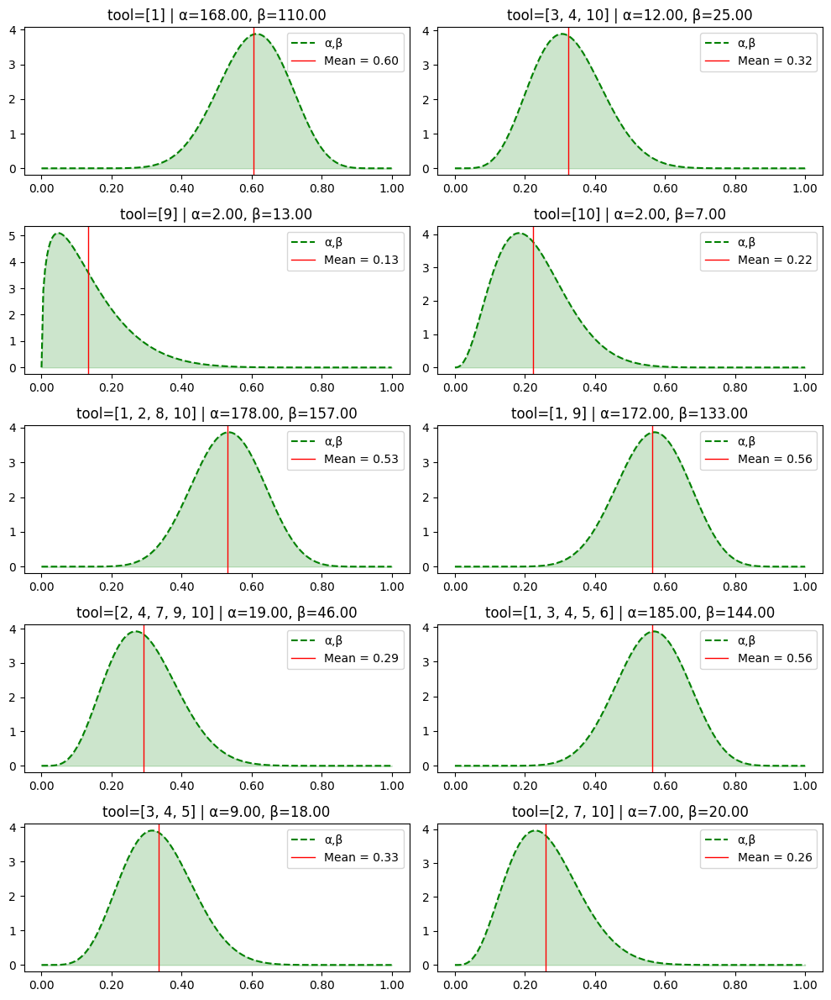

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy.stats import beta

fig, axes = plt.subplots(5, 2, figsize=(10, 12))  # 5 rows × 2 cols
axes = axes.flatten()  # so we can index them easily

for idx, x in enumerate(range(10)):
    util = cluster_util[x] if cluster_util[x] != [] else [0]
    cartesian = list(itertools.product(util, repeat=2))
    unique_pairs = cartesian

    lalpha = [
        np.sum([np.tril(galpha, k=0)[m][pair] for pair in unique_pairs])
        for m in range(galpha.shape[0])
    ]
    lbeta = [
        np.sum([np.tril(gbeta, k=0)[m][pair] for pair in unique_pairs])
        for m in range(gbeta.shape[0])
    ]

    a = lalpha[5]
    b = lbeta[5]
    # w = 0.3
    n=a+b
    myu = a/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    # alpha = tmp * np.array(myu, dtype=float)
    # beta  = tmp * (1-np.array(myu, dtype=float))
   
    # w = np.maximum(np.exp(-K * n),1e-2)
    print(f"Util: {util}, Alpha: {a}, Beta: {b}")

    x_vals = np.linspace(0, 1, 200)

    # Base Beta PDF (blue)
    y_base = beta.pdf(x_vals, a, b)
    mean_base = a / (a + b)

    # Scaled Beta PDF (green)
    y_scaled = beta.pdf(x_vals, n_new * myu, n_new * (1-myu))
    mean_scaled = (n_new * myu) / ((n_new * myu) + n_new * (1-myu))

    ax = axes[idx]
    # ax.plot(x_vals, y_base, color="blue", label="α, β")
    ax.plot(x_vals, y_scaled, color="green", linestyle="--", label=f"α,β")

    # Fill the area under scaled curve with green
    ax.fill_between(x_vals, y_scaled, color="green", alpha=0.2)

    # Add vertical lines for means, with legend labels
    ax.axvline(mean_base, color="red", linestyle="-", linewidth=1,
               label=f"Mean = {mean_base:.2f}")
    

    # Create ticks: regular 0.1 steps + mean positions
    base_ticks = np.round(np.arange(0, 1.01, 0.2), 2).tolist()
    special_ticks = sorted(set(base_ticks))
    ax.set_xticks(special_ticks)
    ax.set_xticklabels([f"{t:.2f}" for t in special_ticks])

    ax.set_title(f"tool={util} | α={a:.2f}, β={b:.2f}")
    ax.legend()

plt.tight_layout()
plt.show()


## 0.05

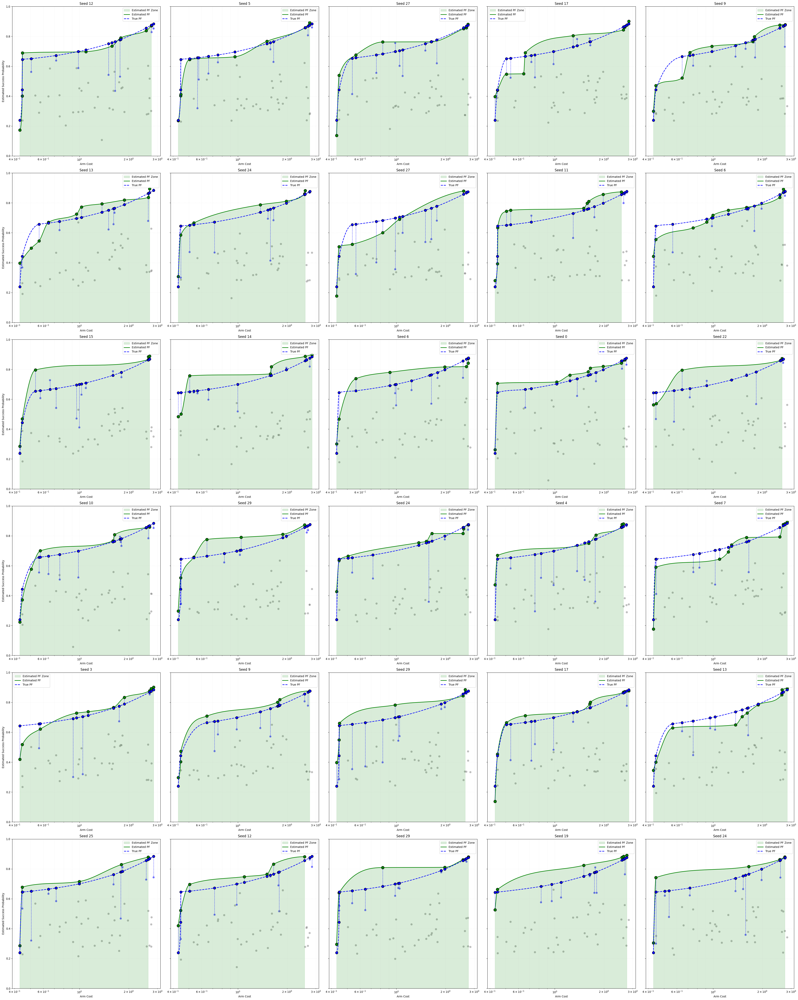

In [18]:
import itertools
N_ROUNDS = 1696
N_PRIOR = 0
K = 0.05
# LR = 0.2
L = 0

# --------- Plot Setup ---------
N_PLOT = 30  # Last 30 iterations to plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 50), sharey=True)
axes = axes.flatten()

galpha = np.ones((N_ARMS, 11, 11))
gbeta = np.ones((N_ARMS, 11, 11))
calls = 0
igd = []
cost_regrets = []
all_avg_regret = []
called_arms = [set() for _ in range(len(SEEDS))]
model_labels = [f'arm_{i}' for i in range(N_ARMS)]
f1s = []

for idx, seed in enumerate(SEEDS):
    np.random.seed(seed)

    # --- Initialize true probabilities ---
    true_probs = np.linspace(0.1, 0.5, N_ARMS)
    half_from_global = np.random.choice(global_good_indices, size=4, replace=False)
    true_probs[half_from_global] = GLOBAL_GOOD_PROB + arm_costs[half_from_global] * 0.1

    other_indices = np.setdiff1d(np.arange(N_ARMS), global_good_indices)
    local_other = np.random.choice(other_indices, size=10, replace=False)
    local_good_indices = np.concatenate((half_from_global, local_other))
    true_probs[local_good_indices] = LOCAL_GOOD_PROB + arm_costs[local_good_indices] * 0.1

    # --- Compute cluster Cartesian pairs ---
    util = cluster_util[seed_to_cluster[seed]] if cluster_util[seed_to_cluster[seed]] != [] else [0]
    unique_pairs = list(itertools.product(util, repeat=2))

    tri_alpha = np.tril(galpha, k=0)
    tri_beta  = np.tril(gbeta,  k=0)

    rows, cols = np.array(unique_pairs).T
    lalpha = tri_alpha[:, rows, cols].sum(axis=1)
    lbeta  = tri_beta[:, rows, cols].sum(axis=1)

    n = lalpha + lbeta
    myu = lalpha/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    alpha = myu * n_new
    beta  = (1 - myu) * n_new

    preva, prevb = alpha.copy(), beta.copy()
    optimal_prob = true_probs.max()

    # --- Storage for arms & successes ---
    arms = np.empty(N_ROUNDS, dtype=int)
    successes = np.empty(N_ROUNDS, dtype=int)

    # ----------- TS MAIN LOOP -----------
    for t in range(N_ROUNDS):
        theta = sample_ts_theta(alpha, beta)
        arm = np.argmax(theta)
        arms[t] = arm

        success = np.random.binomial(1, true_probs[arm])
        successes[t] = success

        alpha[arm] += success
        beta[arm]  += 1 - success

    calls += N_ROUNDS
    called_arms[idx].update(arms)

    # Compute regret & cost regret in bulk
    regrets = optimal_prob - true_probs[arms]
    cost_regrets.extend(arm_costs[arms] * regrets)
    all_avg_regret.append(np.mean(regrets))

    est_probs = alpha / (alpha + beta)
    est_data = pd.DataFrame({'Cost': arm_costs, 'Score': est_probs, 'Model': model_labels})
    true_data = pd.DataFrame({'Cost': arm_costs, 'Score': true_probs, 'Model': model_labels})

    fPareto = get_fPareto_function(compute_pareto(est_data, 'Cost', 'Score'))
    est_pf = compute_pareto(est_data, 'Cost', 'Score')
    true_pf = compute_pareto(true_data, 'Cost', 'Score')
    igd.append(compute_IGD(true_pf[['Cost', 'Score']].to_numpy(),
                           est_pf[['Cost', 'Score']].to_numpy()))

    est_models = set(est_pf["Model"])
    true_models = set(true_pf["Model"])
    tp = len(est_models & true_models)
    fp = len(est_models - true_models)
    fn = len(true_models - est_models)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    f1s.append(f1)

    # --- Update global priors for meta-learning ---
    oalp = alpha - preva
    obet = beta - prevb
    for x in range(N_ARMS):
        for y in unique_pairs:
            galpha[x][y] += oalp[x]
            gbeta[x][y] += obet[x]

    # ----------- Plot last 30 seeds using plot_frontier_panel -----------
    if idx >= len(SEEDS) - N_PLOT:
        ax_idx = idx - (len(SEEDS) - N_PLOT)
        ax = axes[ax_idx]
        plot_frontier_panel(ax, est_data, true_data, jitter=False, seed=seed, lam=L)
        ax.set_title(f"Seed {seed}")
        ax.set_xlabel("Arm Cost")
        ax.set_ylabel("Estimated Success Probability")

# Remove unused subplots
for j in range(N_PLOT, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Summary stats ---
avg_api_calls = calls // len(SEEDS)
avg_arms_called = np.mean([len(x) for x in called_arms])
avg_igd = np.mean(igd)
avg_regret = np.mean(all_avg_regret)
avg_costregret = np.mean(cost_regrets)


In [19]:
print(f"Number of API calls per seed: {avg_api_calls}")
print(f"Average distinct arms called per seed: {avg_arms_called:.2f}")
print(f"Pareto quality (mean IGD): {avg_igd:.4f}")
print(f"Average regret per pull: {avg_regret:.4f}")
print(f"Average cost regret per pull: {avg_costregret:.4f}")
print(f"Average F1 Score:  {np.mean(f1s):.4f}")

Number of API calls per seed: 1696
Average distinct arms called per seed: 49.99
Pareto quality (mean IGD): 0.1108
Average regret per pull: 0.0854
Average cost regret per pull: 0.1327
Average F1 Score:  0.6328


Util: [1], Alpha: 3178.0, Beta: 1734.0
Util: [3, 4, 10], Alpha: 4584.0, Beta: 4930.0
Util: [9], Alpha: 122.0, Beta: 640.0
Util: [10], Alpha: 2663.0, Beta: 1800.0
Util: [1, 2, 8, 10], Alpha: 18047.0, Beta: 9448.0
Util: [1, 9], Alpha: 3338.0, Beta: 2642.0
Util: [2, 4, 7, 9, 10], Alpha: 9195.0, Beta: 9435.0
Util: [1, 3, 4, 5, 6], Alpha: 10944.0, Beta: 8532.0
Util: [3, 4, 5], Alpha: 3470.0, Beta: 4038.0
Util: [2, 7, 10], Alpha: 7963.0, Beta: 5914.0


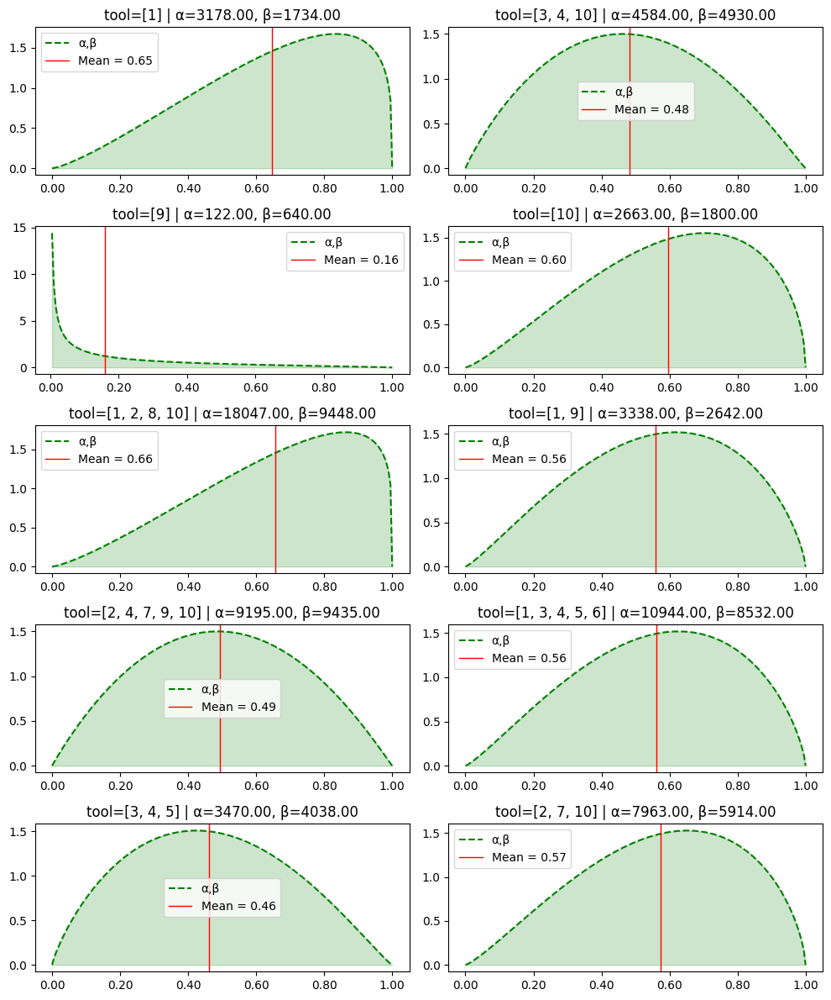

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy.stats import beta

fig, axes = plt.subplots(5, 2, figsize=(10, 12))  # 5 rows × 2 cols
axes = axes.flatten()  # so we can index them easily

for idx, x in enumerate(range(10)):
    util = cluster_util[x] if cluster_util[x] != [] else [0]
    cartesian = list(itertools.product(util, repeat=2))
    unique_pairs = cartesian

    lalpha = [
        np.sum([np.tril(galpha, k=0)[m][pair] for pair in unique_pairs])
        for m in range(galpha.shape[0])
    ]
    lbeta = [
        np.sum([np.tril(gbeta, k=0)[m][pair] for pair in unique_pairs])
        for m in range(gbeta.shape[0])
    ]

    a = lalpha[5]
    b = lbeta[5]
    # w = 0.3
    n=a+b
    myu = a/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    # alpha = tmp * np.array(myu, dtype=float)
    # beta  = tmp * (1-np.array(myu, dtype=float))
   
    # w = np.maximum(np.exp(-K * n),1e-2)
    print(f"Util: {util}, Alpha: {a}, Beta: {b}")

    x_vals = np.linspace(0, 1, 200)

    # Base Beta PDF (blue)
    y_base = beta.pdf(x_vals, a, b)
    mean_base = a / (a + b)

    # Scaled Beta PDF (green)
    y_scaled = beta.pdf(x_vals, n_new * myu, n_new * (1-myu))
    mean_scaled = (n_new * myu) / ((n_new * myu) + n_new * (1-myu))

    ax = axes[idx]
    # ax.plot(x_vals, y_base, color="blue", label="α, β")
    ax.plot(x_vals, y_scaled, color="green", linestyle="--", label=f"α,β")

    # Fill the area under scaled curve with green
    ax.fill_between(x_vals, y_scaled, color="green", alpha=0.2)

    # Add vertical lines for means, with legend labels
    ax.axvline(mean_base, color="red", linestyle="-", linewidth=1,
               label=f"Mean = {mean_base:.2f}")
    

    # Create ticks: regular 0.1 steps + mean positions
    base_ticks = np.round(np.arange(0, 1.01, 0.2), 2).tolist()
    special_ticks = sorted(set(base_ticks))
    ax.set_xticks(special_ticks)
    ax.set_xticklabels([f"{t:.2f}" for t in special_ticks])

    ax.set_title(f"tool={util} | α={a:.2f}, β={b:.2f}")
    ax.legend()

plt.tight_layout()
plt.show()


## 0.1

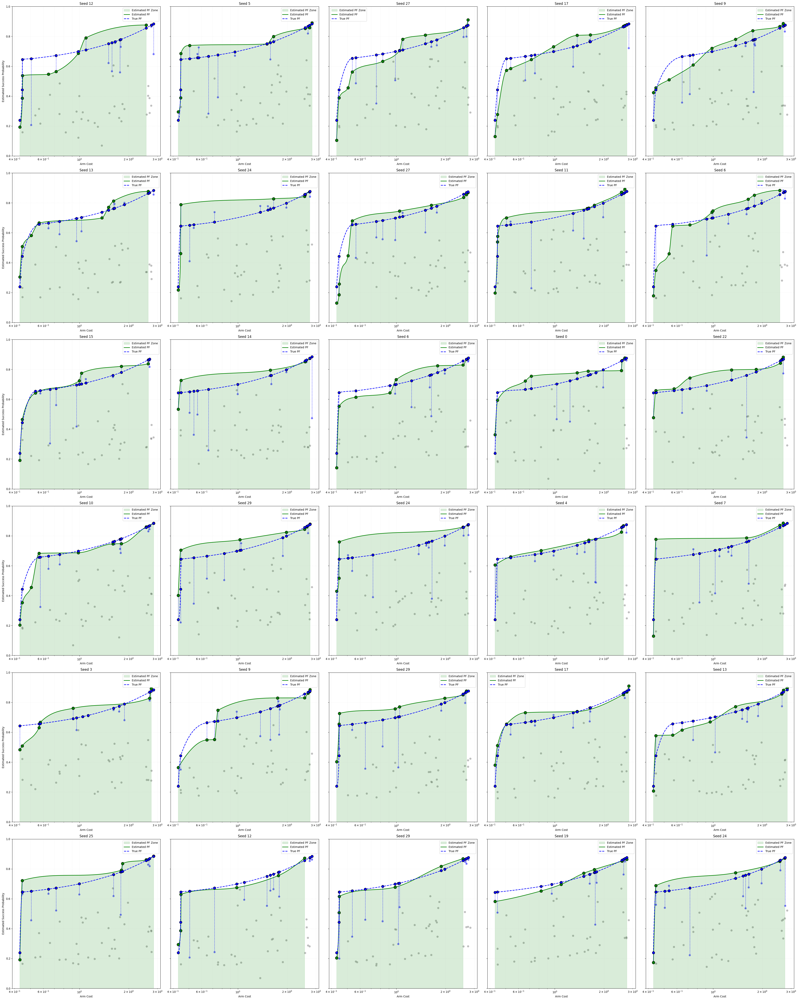

In [21]:
import itertools
N_ROUNDS = 1696
N_PRIOR = 0
K = 0.1
# LR = 0.2
L = 0

# --------- Plot Setup ---------
N_PLOT = 30  # Last 30 iterations to plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 50), sharey=True)
axes = axes.flatten()

galpha = np.ones((N_ARMS, 11, 11))
gbeta = np.ones((N_ARMS, 11, 11))
calls = 0
igd = []
cost_regrets = []
all_avg_regret = []
called_arms = [set() for _ in range(len(SEEDS))]
model_labels = [f'arm_{i}' for i in range(N_ARMS)]
f1s = []

for idx, seed in enumerate(SEEDS):
    np.random.seed(seed)

    # --- Initialize true probabilities ---
    true_probs = np.linspace(0.1, 0.5, N_ARMS)
    half_from_global = np.random.choice(global_good_indices, size=4, replace=False)
    true_probs[half_from_global] = GLOBAL_GOOD_PROB + arm_costs[half_from_global] * 0.1

    other_indices = np.setdiff1d(np.arange(N_ARMS), global_good_indices)
    local_other = np.random.choice(other_indices, size=10, replace=False)
    local_good_indices = np.concatenate((half_from_global, local_other))
    true_probs[local_good_indices] = LOCAL_GOOD_PROB + arm_costs[local_good_indices] * 0.1

    # --- Compute cluster Cartesian pairs ---
    util = cluster_util[seed_to_cluster[seed]] if cluster_util[seed_to_cluster[seed]] != [] else [0]
    unique_pairs = list(itertools.product(util, repeat=2))

    tri_alpha = np.tril(galpha, k=0)
    tri_beta  = np.tril(gbeta,  k=0)

    rows, cols = np.array(unique_pairs).T
    lalpha = tri_alpha[:, rows, cols].sum(axis=1)
    lbeta  = tri_beta[:, rows, cols].sum(axis=1)

    n = lalpha + lbeta
    myu = lalpha/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    alpha = myu * n_new
    beta  = (1 - myu) * n_new

    preva, prevb = alpha.copy(), beta.copy()
    optimal_prob = true_probs.max()

    # --- Storage for arms & successes ---
    arms = np.empty(N_ROUNDS, dtype=int)
    successes = np.empty(N_ROUNDS, dtype=int)

    # ----------- TS MAIN LOOP -----------
    for t in range(N_ROUNDS):
        theta = sample_ts_theta(alpha, beta)
        arm = np.argmax(theta)
        arms[t] = arm

        success = np.random.binomial(1, true_probs[arm])
        successes[t] = success

        alpha[arm] += success
        beta[arm]  += 1 - success

    calls += N_ROUNDS
    called_arms[idx].update(arms)

    # Compute regret & cost regret in bulk
    regrets = optimal_prob - true_probs[arms]
    cost_regrets.extend(arm_costs[arms] * regrets)
    all_avg_regret.append(np.mean(regrets))

    est_probs = alpha / (alpha + beta)
    est_data = pd.DataFrame({'Cost': arm_costs, 'Score': est_probs, 'Model': model_labels})
    true_data = pd.DataFrame({'Cost': arm_costs, 'Score': true_probs, 'Model': model_labels})

    fPareto = get_fPareto_function(compute_pareto(est_data, 'Cost', 'Score'))
    est_pf = compute_pareto(est_data, 'Cost', 'Score')
    true_pf = compute_pareto(true_data, 'Cost', 'Score')
    igd.append(compute_IGD(true_pf[['Cost', 'Score']].to_numpy(),
                           est_pf[['Cost', 'Score']].to_numpy()))

    est_models = set(est_pf["Model"])
    true_models = set(true_pf["Model"])
    tp = len(est_models & true_models)
    fp = len(est_models - true_models)
    fn = len(true_models - est_models)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    f1s.append(f1)

    # --- Update global priors for meta-learning ---
    oalp = alpha - preva
    obet = beta - prevb
    for x in range(N_ARMS):
        for y in unique_pairs:
            galpha[x][y] += oalp[x]
            gbeta[x][y] += obet[x]

    # ----------- Plot last 30 seeds using plot_frontier_panel -----------
    if idx >= len(SEEDS) - N_PLOT:
        ax_idx = idx - (len(SEEDS) - N_PLOT)
        ax = axes[ax_idx]
        plot_frontier_panel(ax, est_data, true_data, jitter=False, seed=seed, lam=L)
        ax.set_title(f"Seed {seed}")
        ax.set_xlabel("Arm Cost")
        ax.set_ylabel("Estimated Success Probability")

# Remove unused subplots
for j in range(N_PLOT, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Summary stats ---
avg_api_calls = calls // len(SEEDS)
avg_arms_called = np.mean([len(x) for x in called_arms])
avg_igd = np.mean(igd)
avg_regret = np.mean(all_avg_regret)
avg_costregret = np.mean(cost_regrets)


In [22]:
print(f"Number of API calls per seed: {avg_api_calls}")
print(f"Average distinct arms called per seed: {avg_arms_called:.2f}")
print(f"Pareto quality (mean IGD): {avg_igd:.4f}")
print(f"Average regret per pull: {avg_regret:.4f}")
print(f"Average cost regret per pull: {avg_costregret:.4f}")
print(f"Average F1 Score:  {np.mean(f1s):.4f}")

Number of API calls per seed: 1696
Average distinct arms called per seed: 49.99
Pareto quality (mean IGD): 0.1145
Average regret per pull: 0.0947
Average cost regret per pull: 0.1407
Average F1 Score:  0.6366


Util: [1], Alpha: 3502.0, Beta: 1876.0
Util: [3, 4, 10], Alpha: 4764.0, Beta: 5419.0
Util: [9], Alpha: 105.0, Beta: 659.0
Util: [10], Alpha: 2885.0, Beta: 1955.0
Util: [1, 2, 8, 10], Alpha: 18507.0, Beta: 9913.0
Util: [1, 9], Alpha: 3661.0, Beta: 2825.0
Util: [2, 4, 7, 9, 10], Alpha: 10327.0, Beta: 10346.0
Util: [1, 3, 4, 5, 6], Alpha: 11121.0, Beta: 9278.0
Util: [3, 4, 5], Alpha: 3459.0, Beta: 4466.0
Util: [2, 7, 10], Alpha: 9338.0, Beta: 6561.0


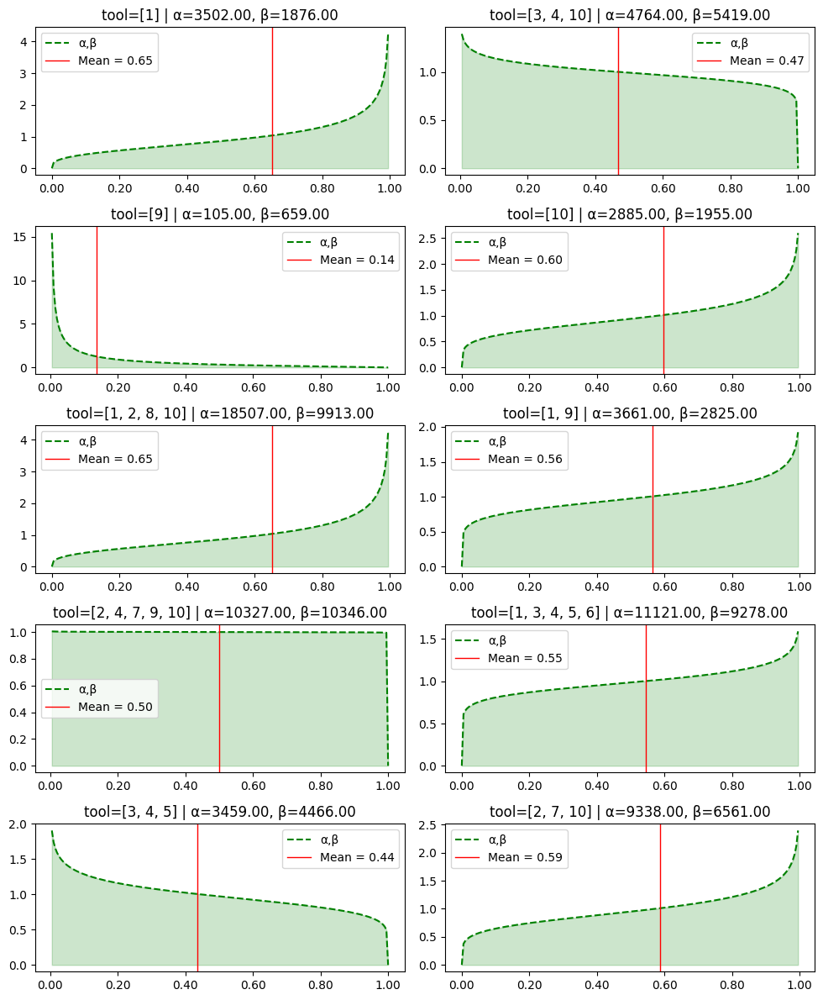

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy.stats import beta

fig, axes = plt.subplots(5, 2, figsize=(10, 12))  # 5 rows × 2 cols
axes = axes.flatten()  # so we can index them easily

for idx, x in enumerate(range(10)):
    util = cluster_util[x] if cluster_util[x] != [] else [0]
    cartesian = list(itertools.product(util, repeat=2))
    unique_pairs = cartesian

    lalpha = [
        np.sum([np.tril(galpha, k=0)[m][pair] for pair in unique_pairs])
        for m in range(galpha.shape[0])
    ]
    lbeta = [
        np.sum([np.tril(gbeta, k=0)[m][pair] for pair in unique_pairs])
        for m in range(gbeta.shape[0])
    ]

    a = lalpha[5]
    b = lbeta[5]
    # w = 0.3
    n=a+b
    myu = a/n

    n_new = (myu * (1 - myu)) / K - 1
    n_new = np.maximum(n_new, 2)

    # alpha = tmp * np.array(myu, dtype=float)
    # beta  = tmp * (1-np.array(myu, dtype=float))
   
    # w = np.maximum(np.exp(-K * n),1e-2)
    print(f"Util: {util}, Alpha: {a}, Beta: {b}")

    x_vals = np.linspace(0, 1, 200)

    # Base Beta PDF (blue)
    y_base = beta.pdf(x_vals, a, b)
    mean_base = a / (a + b)

    # Scaled Beta PDF (green)
    y_scaled = beta.pdf(x_vals, n_new * myu, n_new * (1-myu))
    mean_scaled = (n_new * myu) / ((n_new * myu) + n_new * (1-myu))

    ax = axes[idx]
    # ax.plot(x_vals, y_base, color="blue", label="α, β")
    ax.plot(x_vals, y_scaled, color="green", linestyle="--", label=f"α,β")

    # Fill the area under scaled curve with green
    ax.fill_between(x_vals, y_scaled, color="green", alpha=0.2)

    # Add vertical lines for means, with legend labels
    ax.axvline(mean_base, color="red", linestyle="-", linewidth=1,
               label=f"Mean = {mean_base:.2f}")
    

    # Create ticks: regular 0.1 steps + mean positions
    base_ticks = np.round(np.arange(0, 1.01, 0.2), 2).tolist()
    special_ticks = sorted(set(base_ticks))
    ax.set_xticks(special_ticks)
    ax.set_xticklabels([f"{t:.2f}" for t in special_ticks])

    ax.set_title(f"tool={util} | α={a:.2f}, β={b:.2f}")
    ax.legend()

plt.tight_layout()
plt.show()
